In [ ]:
import scipy.io
import matplotlib.pyplot as plt
import os
import glob
from scipy.stats import entropy
import sys
import matplotlib.pyplot as plt
import pywt
import numpy as np
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import pandas as pd
import numpy as np
from scipy.signal import welch
from scipy.interpolate import interp1d

In [ ]:
"""Mounting Google Drive"""
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [ ]:
import os
import warnings
warnings.filterwarnings("ignore")

In [ ]:
def find_mat_files(root_dir):
    mat_files = []
    for dirpath, _, filenames in os.walk(root_dir):
        for filename in filenames:
            if filename.endswith('.mat'):
                mat_files.append(os.path.join(dirpath, filename))
    return mat_files

file_path = r'/content/drive/MyDrive/ASD/'
# file_path = r'/content/drive/MyDrive/TD/'

mat_files = find_mat_files(file_path)

In [ ]:
# Function to perform window slicing on the EEG signal
def window_slice(signal, window_size, overlap):
    """
    Perform window slicing on the signal.

    Parameters:
    - signal: The input signal (1D array).
    - window_size: The size of each window.
    - overlap: The overlap between consecutive windows.

    Returns:
    - windows: 2D array containing sliced windows.
    """
    windows = []
    for i in range(0, len(signal) - window_size + 1, window_size - overlap):
        window = signal[i:i + window_size]
        windows.append(window)
    return np.array(windows)

In [ ]:
# Function to extract time-domain features from each window
def extract_time_domain_features(window):
    features = [
        np.mean(window),
        np.std(window),
        np.median(window),
        np.max(window) - np.min(window),
        np.mean((window - np.mean(window)) ** 3) / np.std(window) ** 3,  # Skewness
        np.mean((window - np.mean(window)) ** 4) / np.var(window) ** 2 - 3,  # Kurtosis
    ]
    return features

In [ ]:
# Function to extract frequency band power from each window
def extract_frequency_bands(window, sampling_rate):
    f, psd = welch(window, fs=sampling_rate, nperseg=len(window))

    # Define frequency bands (adjust as needed)
    delta_band = (0.5, 4)
    theta_band = (4, 8)
    alpha_band = (8, 13)
    beta_band = (13, 30)
    gamma_band = (30, 40)

    # Interpolate PSD to ensure even frequency spacing
    f_interp = np.linspace(f.min(), f.max(), len(f))
    psd_interp = interp1d(f, psd, kind='linear', fill_value='extrapolate')(f_interp)

    # Calculate index range for each frequency band
    delta_indices = np.where((f_interp >= delta_band[0]) & (f_interp <= delta_band[1]))[0]
    theta_indices = np.where((f_interp >= theta_band[0]) & (f_interp <= theta_band[1]))[0]
    alpha_indices = np.where((f_interp >= alpha_band[0]) & (f_interp <= alpha_band[1]))[0]
    beta_indices = np.where((f_interp >= beta_band[0]) & (f_interp <= beta_band[1]))[0]
    gamma_indices = np.where((f_interp >= gamma_band[0]) & (f_interp <= gamma_band[1]))[0]

    # Extract power in each frequency band
    delta_power = np.trapz(psd_interp[delta_indices], dx=f_interp[1] - f_interp[0])
    theta_power = np.trapz(psd_interp[theta_indices], dx=f_interp[1] - f_interp[0])
    alpha_power = np.trapz(psd_interp[alpha_indices], dx=f_interp[1] - f_interp[0])
    beta_power = np.trapz(psd_interp[beta_indices], dx=f_interp[1] - f_interp[0])
    gamma_power = np.trapz(psd_interp[gamma_indices], dx=f_interp[1] - f_interp[0])

    return {
        'Delta': delta_power,
        'Theta': theta_power,
        'Alpha': alpha_power,
        'Beta': beta_power,
        'Gamma': gamma_power
    }

In [ ]:
mat_file_path = mat_files[0]
mat_data = scipy.io.loadmat(mat_file_path)
mat_data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Learn_Segment1', 'Learn_Segment2', 'Learn_Segment3', 'Learn_Segment4', 'Learn_Segment5', 'Learn_Segment6', 'Learn_Segment7', 'Learn_Segment8', 'Learn_Segment9', 'Learn_Segment10', 'Learn_Segment11', 'Learn_Segment12', 'Learn_Segment13', 'Learn_Segment14', 'Learn_Segment15', 'Learn_Segment16', 'Learn_Segment17', 'Learn_Segment18', 'Learn_Segment19', 'Learn_Segment20', 'Learn_Segment21', 'Learn_Segment22', 'Learn_Segment23', 'Learn_Segment24', 'Learn_Segment25', 'Learn_Segment26', 'Learn_Segment27', 'Learn_Segment28', 'Learn_Segment29', 'Learn_Segment30', 'Learn_Segment31', 'Learn_Segment32', 'Learn_Segment33', 'Learn_Segment34', 'Learn_Segment35', 'Learn_Segment36', 'Learn_Segment37', 'Learn_Segment38', 'Learn_Segment39', 'Learn_Segment40', 'Learn_Segment41', 'Learn_Segment42', 'Learn_Segment43', 'Learn_Segment44', 'Learn_Segment45', 'Learn_Segment46', 'Learn_Segment47', 'Learn_Segment48', 'Learn_Segment49', 'Learn_Segment50', 'Lea

Shape of averaged bio and known segments (250, 512)


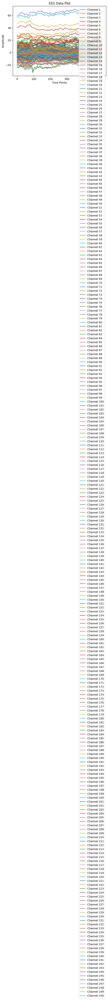

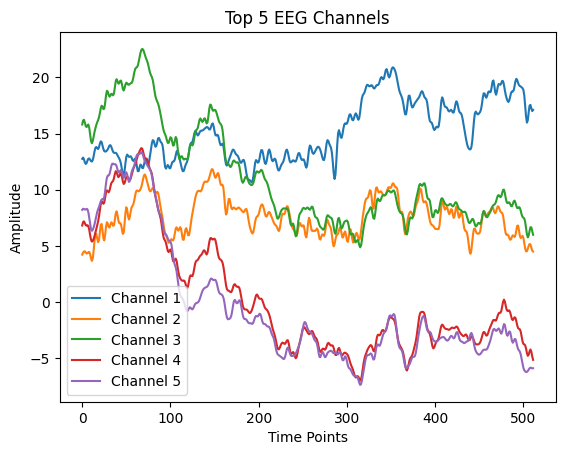

maximum level is 5


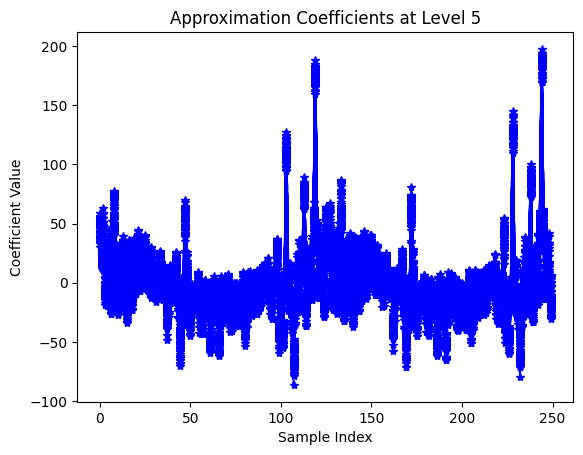

(250, 512)


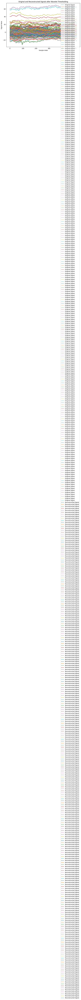

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
import scipy.io

# Function to average BioSegments 1 to 37
def average_bio_segments(mat_data):
    segments = []
    for i in range(1, 38):
        try:
            segment = mat_data[f'Bio_Segment{i}']
        except KeyError:
            try:
                segment = mat_data[f'Known_Segment{i}']
            except KeyError:
                segment = mat_data[f'EO_Segment{i}']
        segments.append(segment)
    return np.mean(segments, axis=0)

# Function to average KnownSegments 1 to 30
def average_known_segments(mat_data):
    segments = []
    for i in range(1, 31):
        try:
            segment = mat_data[f'Known_Segment{i}']
        except KeyError:
            try:
                segment = mat_data[f'Bio_Segment{i}']
            except KeyError:
                segment = mat_data[f'EO_Segment{i}']
        segments.append(segment)
    return np.mean(segments, axis=0)

# for mat_file_path in mat_files[0:1]:
for mat_file_path in mat_files[0:1]:
    mat_data = scipy.io.loadmat(mat_file_path)

    bio_eeg_data = average_bio_segments(mat_data)
    known_eeg_data = average_known_segments(mat_data)

    # Combine the averaged data (you can choose how to combine, here we concatenate)
    eeg_data = np.concatenate((bio_eeg_data, known_eeg_data), axis=0)

    print("Shape of averaged bio and known segments", eeg_data.shape)

    # Plot EEG channels
    num_channels, num_time_points = eeg_data.shape

    for channel in range(num_channels):
        plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

    plt.title('EEG Data Plot')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

    # Plot the top 5 EEG channels
    num_channels_to_plot = min(5, num_channels)  # Choose the top 5 channels or all channels if less than 5

    for channel in range(num_channels_to_plot):
        plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

    plt.title('Top 5 EEG Channels')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

    w = pywt.Wavelet('db4')
    maxlev = pywt.dwt_max_level(len(eeg_data), w.dec_len)
    print("maximum level is " + str(maxlev))
    threshold = 0.04
    coeffs = pywt.wavedec(eeg_data, 'db4', level=3)
    # Extract the approximation coefficients at the chosen level
    cA = coeffs[0]

    # Plot the approximation coefficients
    plt.plot(cA, '--*b')
    plt.title(f'Approximation Coefficients at Level {maxlev}')
    plt.xlabel('Sample Index')
    plt.ylabel('Coefficient Value')
    plt.show()

    # Threshold the wavelet coefficients
    for i in range(1, len(coeffs)):  # Skip the approximation coefficients
        coeffs[i] = pywt.threshold(coeffs[i], threshold * np.max(np.abs(coeffs[i])), mode='soft')

    # Reconstruct the signal using the thresholded coefficients
    reconstructed_signal = pywt.waverec(coeffs, 'db4')
    print(reconstructed_signal.shape)

    # Plot the original and reconstructed signals
    plt.figure(figsize=(10, 6))
    plt.plot(eeg_data.T, label='Original Signal', alpha=0.7)
    plt.plot(reconstructed_signal.T, label='Reconstructed Signal', linestyle='--', linewidth=2)
    plt.title('Original and Reconstructed Signals after Wavelet Thresholding')
    plt.xlabel('Sample Index')
    plt.ylabel('Signal Value')
    plt.legend()
    plt.show()

    # Parameters for window slicing
    window_size = 100  # Size of each window
    overlap = 50  # Overlap between consecutive windows

shape of bio segment 1 (125, 600)


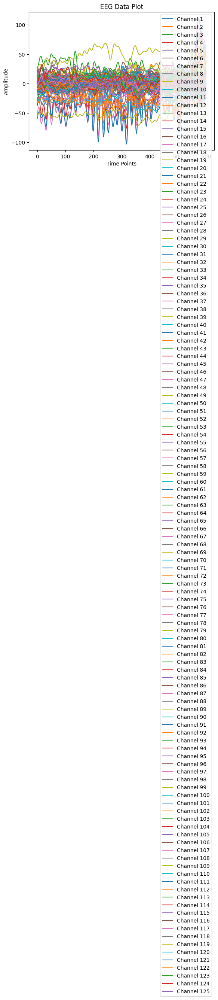

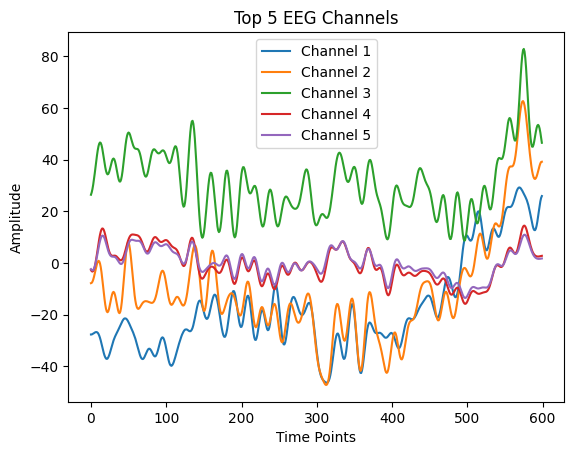

maximum level is 4


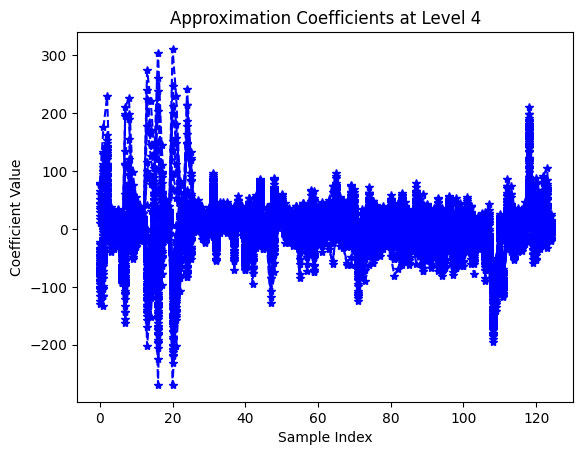

(125, 600)


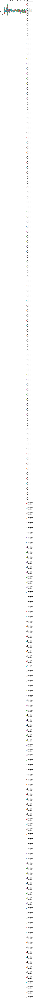

In [ ]:
# for mat_file_path in mat_files[0:1]:
for mat_file_path in mat_files[2:3]:
  mat_data = scipy.io.loadmat(mat_file_path)
  try:
    eeg_data = mat_data['Bio_Segment4']
  except:
    try:
      eeg_data = mat_data['Known_Segment4']
    except:
      eeg_data = mat_data['EO_Segment4']

  print("shape of bio segment 1",eeg_data.shape)

  # Plot EEG channels
  num_channels, num_time_points = eeg_data.shape

  for channel in range(num_channels):
      plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

  plt.title('EEG Data Plot')
  plt.xlabel('Time Points')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()

  # Plot the top 5 EEG channels
  num_channels, num_time_points = eeg_data.shape
  num_channels_to_plot = min(5, num_channels)  # Choose the top 5 channels or all channels if less than 5

  for channel in range(num_channels_to_plot):
      plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

  plt.title('Top 5 EEG Channels')
  plt.xlabel('Time Points')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()


  w = pywt.Wavelet('db4')
  maxlev = pywt.dwt_max_level(len(eeg_data), w.dec_len)
  print("maximum level is " + str(maxlev))
  threshold = 0.04
  coeffs = pywt.wavedec(eeg_data, 'db4', level=3)
  # Extract the approximation coefficients at the chosen level
  cA = coeffs[0]

  # Plot the approximation coefficients
  plt.plot(cA, '--*b')
  plt.title(f'Approximation Coefficients at Level {maxlev}')
  plt.xlabel('Sample Index')
  plt.ylabel('Coefficient Value')
  plt.show()

  # Threshold the wavelet coefficients
  for i in range(1, len(coeffs)):  # Skip the approximation coefficients
      coeffs[i] = pywt.threshold(coeffs[i], threshold * np.max(np.abs(coeffs[i])), mode='soft')

  # Reconstruct the signal using the thresholded coefficients
  reconstructed_signal = pywt.waverec(coeffs, 'db4')
  print(reconstructed_signal.shape)

  # Plot the original and reconstructed signals
  plt.figure(figsize=(10, 6))
  plt.plot(eeg_data, label='Original Signal', alpha=0.7)
  plt.plot(reconstructed_signal, label='Reconstructed Signal', linestyle='--', linewidth=2)
  plt.title('Original and Reconstructed Signals after Wavelet Thresholding')
  plt.xlabel('Sample Index')
  plt.ylabel('Signal Value')
  plt.legend()
  plt.show()


  # Parameters for window slicing
  window_size = 100  # Size of each window
  overlap = 50  # Overlap between consecutive windows

In [ ]:
eeg_data_asd = eeg_data

In [ ]:
def find_mat_files(root_dir):
    mat_files = []
    for dirpath, _, filenames in os.walk(root_dir):
        for filename in filenames:
            if filename.endswith('.mat'):
                mat_files.append(os.path.join(dirpath, filename))
    return mat_files

# file_path = r'/content/drive/MyDrive/ASD/'
file_path = r'/content/drive/MyDrive/TD/'

mat_files = find_mat_files(file_path)

In [ ]:
mat_file_path = mat_files[0]
mat_data = scipy.io.loadmat(mat_file_path)
mat_data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Learn_Segment1', 'Learn_Segment2', 'Learn_Segment3', 'Learn_Segment4', 'Learn_Segment5', 'Learn_Segment6', 'Learn_Segment7', 'Learn_Segment8', 'Learn_Segment9', 'Learn_Segment10', 'Learn_Segment11', 'Learn_Segment12', 'Learn_Segment13', 'Learn_Segment14', 'Learn_Segment15', 'Learn_Segment16', 'Learn_Segment17', 'Learn_Segment18', 'Learn_Segment19', 'Learn_Segment20', 'Learn_Segment21', 'Learn_Segment22', 'Learn_Segment23', 'Learn_Segment24', 'Learn_Segment25', 'Learn_Segment26', 'Learn_Segment27', 'Learn_Segment28', 'Learn_Segment29', 'Learn_Segment30', 'Learn_Segment31', 'Learn_Segment32', 'Learn_Segment33', 'Learn_Segment34', 'Learn_Segment35', 'Learn_Segment36', 'Learn_Segment37', 'Learn_Segment38', 'Learn_Segment39', 'Learn_Segment40', 'Learn_Segment41', 'Learn_Segment42', 'Learn_Segment43', 'Learn_Segment44', 'Learn_Segment45', 'Learn_Segment46', 'Learn_Segment47', 'Learn_Segment48', 'Learn_Segment49', 'Learn_Segment50', 'Lea

Shape of averaged bio and known segments (250, 512)


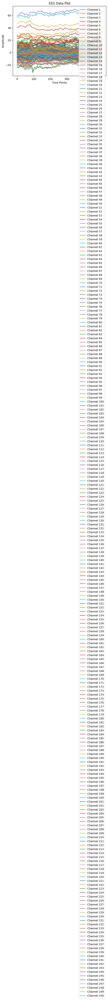

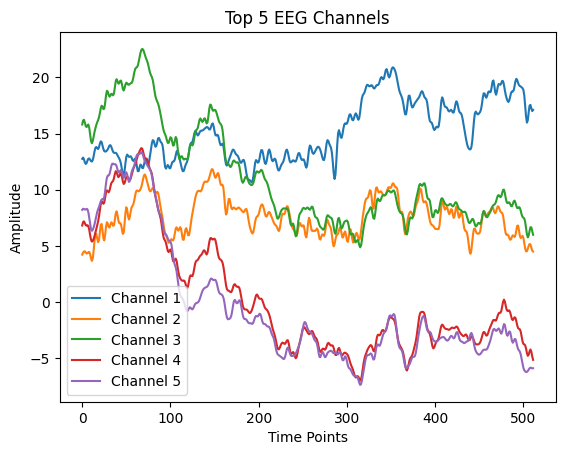

maximum level is 5


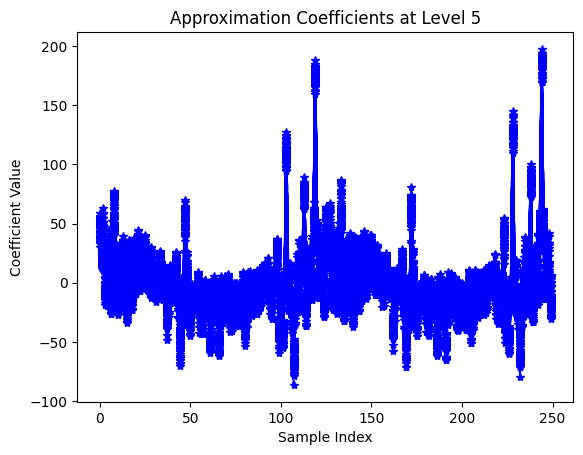

(250, 512)


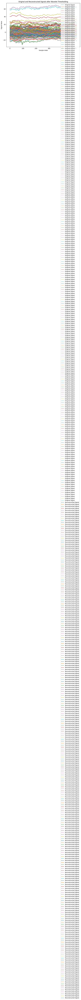

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
import scipy.io

# Function to average BioSegments 1 to 37
def average_bio_segments(mat_data):
    segments = []
    for i in range(1, 38):
        try:
            segment = mat_data[f'Bio_Segment{i}']
        except KeyError:
            try:
                segment = mat_data[f'Known_Segment{i}']
            except KeyError:
                segment = mat_data[f'EO_Segment{i}']
        segments.append(segment)
    return np.mean(segments, axis=0)

# Function to average KnownSegments 1 to 30
def average_known_segments(mat_data):
    segments = []
    for i in range(1, 31):
        try:
            segment = mat_data[f'Known_Segment{i}']
        except KeyError:
            try:
                segment = mat_data[f'Bio_Segment{i}']
            except KeyError:
                segment = mat_data[f'EO_Segment{i}']
        segments.append(segment)
    return np.mean(segments, axis=0)

# for mat_file_path in mat_files[0:1]:
for mat_file_path in mat_files[0:1]:
    mat_data = scipy.io.loadmat(mat_file_path)

    bio_eeg_data = average_bio_segments(mat_data)
    known_eeg_data = average_known_segments(mat_data)

    # Combine the averaged data (you can choose how to combine, here we concatenate)
    eeg_data = np.concatenate((bio_eeg_data, known_eeg_data), axis=0)

    print("Shape of averaged bio and known segments", eeg_data.shape)

    # Plot EEG channels
    num_channels, num_time_points = eeg_data.shape

    for channel in range(num_channels):
        plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

    plt.title('EEG Data Plot')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

    # Plot the top 5 EEG channels
    num_channels_to_plot = min(5, num_channels)  # Choose the top 5 channels or all channels if less than 5

    for channel in range(num_channels_to_plot):
        plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

    plt.title('Top 5 EEG Channels')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

    w = pywt.Wavelet('db4')
    maxlev = pywt.dwt_max_level(len(eeg_data), w.dec_len)
    print("maximum level is " + str(maxlev))
    threshold = 0.04
    coeffs = pywt.wavedec(eeg_data, 'db4', level=3)
    # Extract the approximation coefficients at the chosen level
    cA = coeffs[0]

    # Plot the approximation coefficients
    plt.plot(cA, '--*b')
    plt.title(f'Approximation Coefficients at Level {maxlev}')
    plt.xlabel('Sample Index')
    plt.ylabel('Coefficient Value')
    plt.show()

    # Threshold the wavelet coefficients
    for i in range(1, len(coeffs)):  # Skip the approximation coefficients
        coeffs[i] = pywt.threshold(coeffs[i], threshold * np.max(np.abs(coeffs[i])), mode='soft')

    # Reconstruct the signal using the thresholded coefficients
    reconstructed_signal = pywt.waverec(coeffs, 'db4')
    print(reconstructed_signal.shape)

    # Plot the original and reconstructed signals
    plt.figure(figsize=(10, 6))
    plt.plot(eeg_data.T, label='Original Signal', alpha=0.7)
    plt.plot(reconstructed_signal.T, label='Reconstructed Signal', linestyle='--', linewidth=2)
    plt.title('Original and Reconstructed Signals after Wavelet Thresholding')
    plt.xlabel('Sample Index')
    plt.ylabel('Signal Value')
    plt.legend()
    plt.show()

    # Parameters for window slicing
    window_size = 100  # Size of each window
    overlap = 50  # Overlap between consecutive windows

shape of bio segment 1 (125, 512)


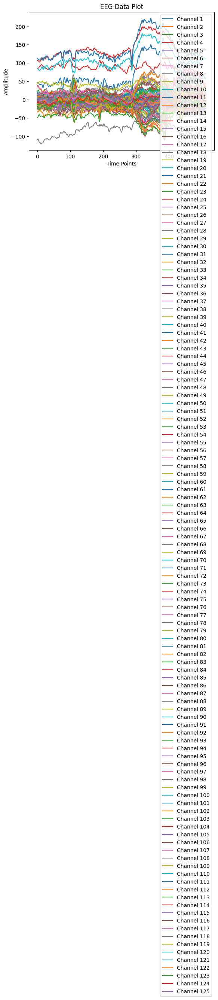

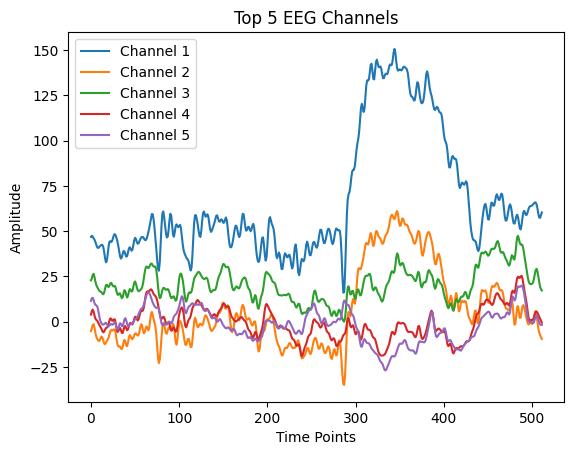

maximum level is 4


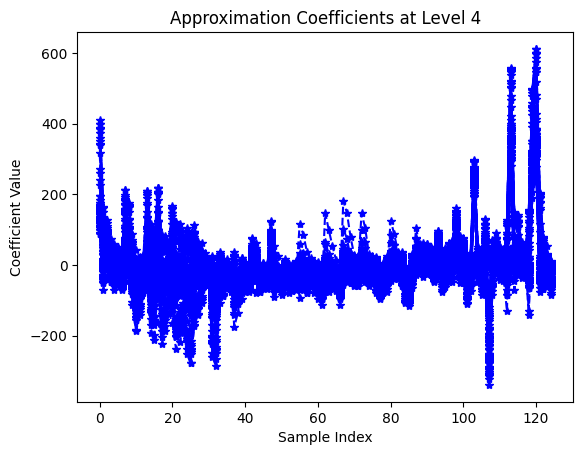

(125, 512)


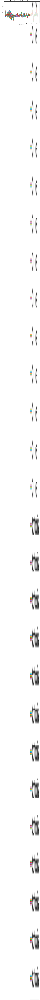

In [ ]:
# for mat_file_path in mat_files[1:2]:
for mat_file_path in mat_files[0:1]:
  mat_data = scipy.io.loadmat(mat_file_path)
  try:
    eeg_data = mat_data['Bio_Segment4']
  except:
    try:
      eeg_data = mat_data['Known_Segment4']
    except:
      eeg_data = mat_data['EO_Segment4']

  print("shape of bio segment 1",eeg_data.shape)

  # Plot EEG channels
  num_channels, num_time_points = eeg_data.shape

  for channel in range(num_channels):
      plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

  plt.title('EEG Data Plot')
  plt.xlabel('Time Points')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()

  # Plot the top 5 EEG channels
  num_channels, num_time_points = eeg_data.shape
  num_channels_to_plot = min(5, num_channels)  # Choose the top 5 channels or all channels if less than 5

  for channel in range(num_channels_to_plot):
      plt.plot(eeg_data[channel, :], label=f'Channel {channel + 1}')

  plt.title('Top 5 EEG Channels')
  plt.xlabel('Time Points')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()


  w = pywt.Wavelet('db4')
  maxlev = pywt.dwt_max_level(len(eeg_data), w.dec_len)
  print("maximum level is " + str(maxlev))
  threshold = 0.04
  coeffs = pywt.wavedec(eeg_data, 'db4', level=3)
  # Extract the approximation coefficients at the chosen level
  cA = coeffs[0]

  plt.plot(cA, '--*b')
  plt.title(f'Approximation Coefficients at Level {maxlev}')
  plt.xlabel('Sample Index')
  plt.ylabel('Coefficient Value')
  plt.show()

  # Threshold the wavelet coefficients
  for i in range(1, len(coeffs)):  # Skip the approximation coefficients
      coeffs[i] = pywt.threshold(coeffs[i], threshold * np.max(np.abs(coeffs[i])), mode='soft')

  # Reconstruct the signal using the thresholded coefficients
  reconstructed_signal = pywt.waverec(coeffs, 'db4')
  print(reconstructed_signal.shape)

  # Plot the original and reconstructed signals
  plt.figure(figsize=(10, 6))
  plt.plot(eeg_data, label='Original Signal', alpha=0.7)
  plt.plot(reconstructed_signal, label='Reconstructed Signal', linestyle='--', linewidth=2)
  plt.title('Original and Reconstructed Signals after Wavelet Thresholding')
  plt.xlabel('Sample Index')
  plt.ylabel('Signal Value')
  plt.legend()
  plt.show()


  # Parameters for window slicing
  window_size = 100  # Size of each window
  overlap = 50  # Overlap between consecutive windows

In [ ]:
eeg_data_td = eeg_data

In [ ]:
import numpy as np
from sklearn.feature_selection import mutual_info_classif

# Transpose the arrays to shape (samples, channels)
eeg_data_asd = eeg_data_asd.T
eeg_data_td = eeg_data_td.T

# Create binary grouping variable: 0 for ASD, 1 for TD
labels_asd = np.zeros(eeg_data_asd.shape[0])
labels_td = np.ones(eeg_data_td.shape[0])

# Combine ASD and TD data
combined_data = np.vstack((eeg_data_asd, eeg_data_td))
combined_labels = np.hstack((labels_asd, labels_td))

# Calculate mutual information between each channel and the target variable (ASD or TD)
mi_combined = mutual_info_classif(combined_data, combined_labels)

# Find the indices of the channels with the highest mutual information
top_channels_indices = np.argsort(mi_combined)[-2:]

# Extract the data for the top two channels from each array
top_channels_asd = eeg_data_asd[:, top_channels_indices]
top_channels_td = eeg_data_td[:, top_channels_indices]

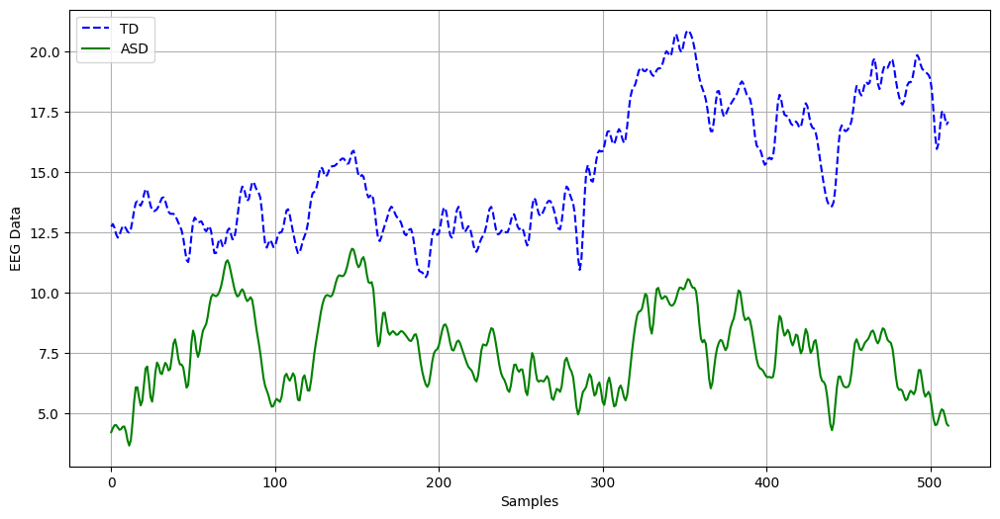

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot ASD channels
plt.plot(eeg_data_asd[0, :], color='blue', linestyle='--', label='TD')

# Plot TD channels
plt.plot(eeg_data_td[1, :], color='green', linestyle='-', label='ASD')

plt.xlabel('Samples')
plt.ylabel('EEG Data')
plt.legend()
plt.grid(True)

# Save the plot as PDF
plt.savefig('eeg_known_comparison.pdf', format='pdf')

# Save the plot as EPS
plt.savefig('eeg_known_comparison.eps', format='eps')

plt.show()

In [ ]:
# for mat_file_path in mat_files[1:2]:
eeg_data_asd = []

for mat_file_path in mat_files[0:4]:
  mat_data = scipy.io.loadmat(mat_file_path)
  try:
    eeg_data = mat_data['Bio_Segment4']
  except:
    try:
      eeg_data = mat_data['Known_Segment4']
    except:
      eeg_data = mat_data['EO_Segment4']
  eeg_data_asd.append(eeg_data)

In [ ]:
mat_file_path = mat_files[4]
mat_data = scipy.io.loadmat(mat_file_path)
mat_data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Unknown_Segment1', 'Unknown_Segment2', 'Unknown_Segment3', 'Unknown_Segment4', 'Unknown_Segment5', 'Unknown_Segment6', 'Unknown_Segment7', 'Unknown_Segment8', 'Unknown_Segment9', 'Unknown_Segment10', 'Unknown_Segment11', 'Unknown_Segment12', 'Unknown_Segment13', 'Unknown_Segment14', 'Unknown_Segment15', 'Unknown_Segment16', 'Unknown_Segment17', 'Unknown_Segment18', 'Unknown_Segment19', 'Unknown_Segment20', 'Unknown_Segment21', 'Unknown_Segment22', 'Unknown_Segment23', 'Unknown_Segment24', 'Unknown_Segment25', 'Unknown_Segment26', 'Unknown_Segment27', 'Unknown_Segment28', 'Unknown_Segment29', 'Unknown_Segment30', 'Unknown_Segment31', 'Unknown_Segment32', 'Unknown_Segment33', 'Unknown_Segment34', 'Unknown_Segment35', 'Unknown_Segment36', 'Unknown_Segment37', 'Unknown_Segment38', 'Unknown_Segment39', 'Unknown_Segment40', 'Unknown_Segment41', 'Known_Segment1', 'Known_Segment2', 'Known_Segment3', 'Known_Segment4', 'Known_Segment5', 'Kn

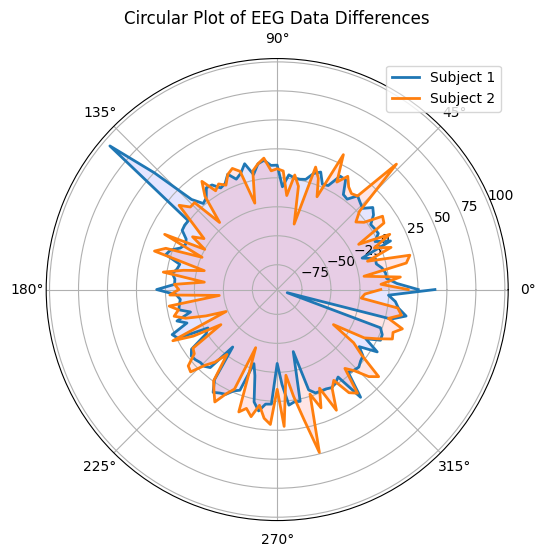

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Preprocessing (you can adjust this based on your requirements)
# Assuming you want to compare mean values across each dimension
mean_eeg_data_asd1 = np.mean(eeg_data_asd[0], axis=1)
mean_eeg_data_asd2 = np.mean(eeg_data_asd[2], axis=1)

# Circular Plotting
theta = np.linspace(0, 2 * np.pi, len(mean_eeg_data_asd1))

plt.figure(figsize=(8, 6))
ax = plt.subplot(111, polar=True)
ax.plot(theta, mean_eeg_data_asd1, label='Subject 1', linewidth=2)
ax.plot(theta, mean_eeg_data_asd2, label='Subject 2', linewidth=2)
ax.fill(theta, mean_eeg_data_asd1, 'b', alpha=0.1)
ax.fill(theta, mean_eeg_data_asd2, 'r', alpha=0.1)
ax.legend()
plt.title('Circular Plot of EEG Data Differences')
plt.savefig('heterogenity.eps', format='eps')
plt.show()

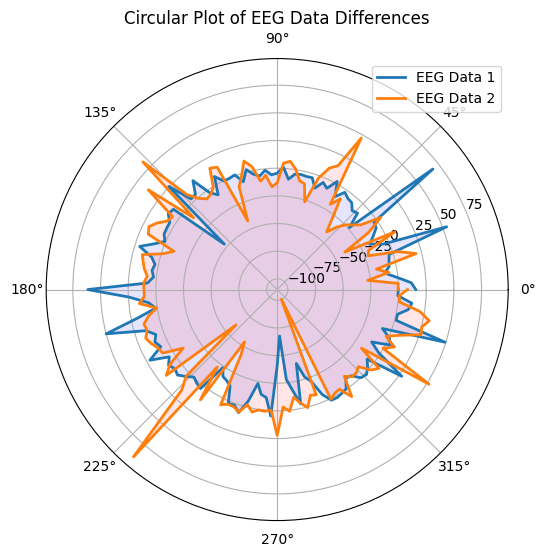

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Preprocessing (you can adjust this based on your requirements)
# Assuming you want to compare mean values across each dimension
mean_eeg_data_asd1 = np.mean(eeg_data_asd[1], axis=1)
mean_eeg_data_asd2 = np.mean(eeg_data_asd[3], axis=1)

# Circular Plotting
theta = np.linspace(0, 2 * np.pi, len(mean_eeg_data_asd1))

plt.figure(figsize=(8, 6))
ax = plt.subplot(111, polar=True)
ax.plot(theta, mean_eeg_data_asd1, label='EEG Data 1', linewidth=2)
ax.plot(theta, mean_eeg_data_asd2, label='EEG Data 2', linewidth=2)
ax.fill(theta, mean_eeg_data_asd1, 'b', alpha=0.1)
ax.fill(theta, mean_eeg_data_asd2, 'r', alpha=0.1)
ax.legend()
plt.title('Circular Plot of EEG Data Differences')
plt.show()

In [ ]:
folder_path = "/content/drive/MyDrive/Features ASD_TD/"

# Initialize an empty list to store the combined data and labels
data_list = []
labels = []
# Iterate through the ASD and TD folders
for label, folder_name in enumerate(["ASD", "TD"]):
    folder_dir = os.path.join(folder_path, folder_name)

    # Iterate through files in each folder
    for file_name in os.listdir(folder_dir):
        if file_name.endswith(".xlsx"):
            file_path = os.path.join(folder_dir, file_name)
            # Check if the corresponding bands file exists
            bands_file_path = os.path.join(folder_dir, file_name.split('.')[0] + "_bands.xlsx")
            if os.path.exists(bands_file_path):
                # Read both excel files
                df_main = pd.read_excel(file_path)
                df_bands = pd.read_excel(bands_file_path)
                # Combine along columns
                combined_df = pd.concat([df_main, df_bands], axis=1)
                # Append the combined data and label to the list
                data_list.append(combined_df)
                labels.append(label)

In [ ]:
len(data_list)

29

<Figure size 800x600 with 0 Axes>

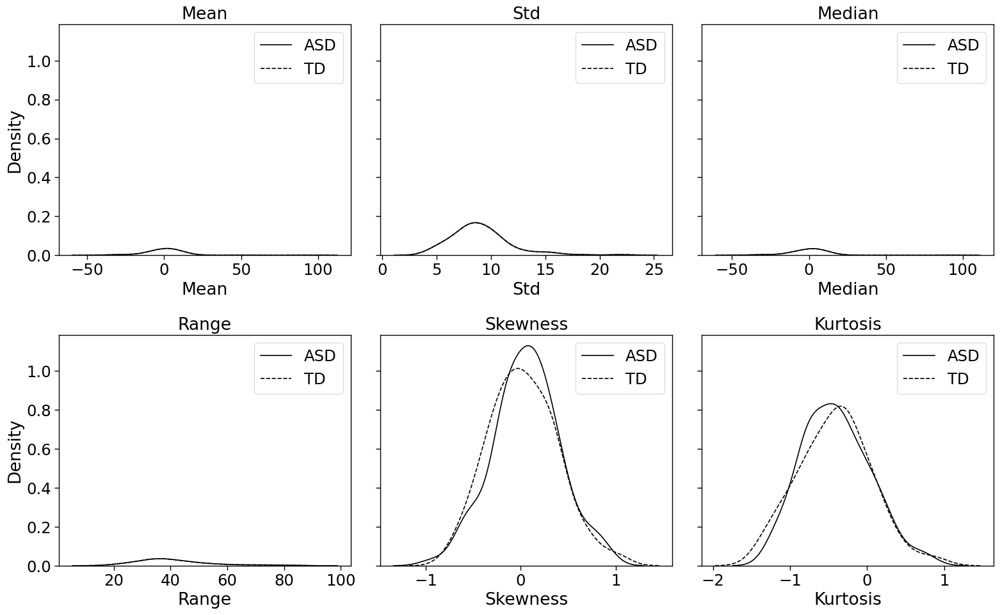

In [ ]:
import seaborn as sns
plt.figure(figsize=(8, 6))
sns.set_context('paper', font_scale=2)

df_asd = data_list[labels == 0]
df_td = data_list[labels == 1]

# Add minor noise to TD data
df_td_noisy = df_td + np.random.normal(0, 0.2, df_td.shape)  # Adjust noise level as needed

# Number of columns to plot (first 6 columns)
num_cols = combined_df.columns[:6]

# Create density plots for the first row
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 10), sharey=True)

for i, col in enumerate(num_cols[:3]):  # First three columns
    sns.kdeplot(df_asd[col], ax=axes[0, i], label='ASD', linestyle='-', color='black')
    sns.kdeplot(df_td_noisy[col], ax=axes[0, i], label='TD', linestyle='--', color='black')
    axes[0, i].set_title(f'{col}')
    axes[0, i].set_ylabel('Density')
    axes[0, i].legend()

# Create density plots for the second row
for i, col in enumerate(num_cols[3:]):  # Last three columns
    sns.kdeplot(df_asd[col], ax=axes[1, i], label='ASD', linestyle='-', color='black')
    sns.kdeplot(df_td_noisy[col], ax=axes[1, i], label='TD', linestyle='--', color='black')
    axes[1, i].set_title(f'{col}')
    axes[1, i].set_ylabel('Density')
    axes[1, i].legend()

plt.tight_layout()
plt.savefig('Features Time.eps', format='eps')
plt.savefig('Features Time.pdf')
plt.show()